# Learning the Embedding with the use of Neural Networks
We'll use Neural Collaborative Filtering (https://arxiv.org/pdf/1708.05031.pdf) to create a NN that learns the embedding of the data

## Necessary imports

In [1]:
import pandas as pd
import re
import numpy as np
from datetime import datetime
## for plotting
import matplotlib.pyplot as plt
import seaborn as sns
## for machine learning
from sklearn import preprocessing, metrics

## Importing the data

In [2]:
movies = pd.read_excel('data/movie_e.xlsx')

In [3]:
movies

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy
...,...,...,...
27273,131254,Kein Bund fÃ¼r's Leben (2007),Comedy
27274,131256,"Feuer, Eis & Dosenbier (2002)",Comedy
27275,131258,The Pirates (2014),Adventure
27276,131260,Rentun Ruusu (2001),(no genres listed)


In [4]:
user_rating = pd.read_csv('data/rating.csv')

In [5]:
user_rating

,userId,movieId,rating,timestamp
0,1,2,3.5,2005-04-02 23:53:47
1,1,29,3.5,2005-04-02 23:31:16
2,1,32,3.5,2005-04-02 23:33:39
3,1,47,3.5,2005-04-02 23:32:07
4,1,50,3.5,2005-04-02 23:29:40
...,...,...,...,...
20000258,138493,68954,4.5,2009-11-13 15:42:00
20000259,138493,69526,4.5,2009-12-03 18:31:48
20000260,138493,69644,3.0,2009-12-07 18:10:57
20000261,138493,70286,5.0,2009-11-13 15:42:24


#### Prepare movies data:

In [6]:
movies = movies[~movies["genres"].isna()]
movies["entry_id"] = range(0, len(movies))
regexp = re.compile(r'[(]\d*?[)]') # mathces (number)

# remove the release year of movies, and save it in another column
movies["movie_name"] = movies["title"].apply(lambda x:
                                             re.sub(regexp, "", x).strip())
# print(movies.loc[15646])
# get the release year and save it in another column

movies["date"] = movies["title"].apply(lambda x: int(x.split("(")[-1].replace(")","").replace("\"", "").strip()) if regexp.search(x) else np.nan)

movies["date"] = movies["date"].fillna(9999)
movies["old"] = movies["date"].apply(lambda x: 1 if x < 2000 else 0)

In [7]:
movies

,movieId,title,genres,entry_id,movie_name,date,old
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,0,Toy Story,1995.0,1
1,2,Jumanji (1995),Adventure|Children|Fantasy,1,Jumanji,1995.0,1
2,3,Grumpier Old Men (1995),Comedy|Romance,2,Grumpier Old Men,1995.0,1
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,3,Waiting to Exhale,1995.0,1
4,5,Father of the Bride Part II (1995),Comedy,4,Father of the Bride Part II,1995.0,1
...,...,...,...,...,...,...,...
27273,131254,Kein Bund fÃ¼r's Leben (2007),Comedy,27273,Kein Bund fÃ¼r's Leben,2007.0,0
27274,131256,"Feuer, Eis & Dosenbier (2002)",Comedy,27274,"Feuer, Eis & Dosenbier",2002.0,0
27275,131258,The Pirates (2014),Adventure,27275,The Pirates,2014.0,0
27276,131260,Rentun Ruusu (2001),(no genres listed),27276,Rentun Ruusu,2001.0,0


#### Prepare user-rating data:

In [8]:
user_rating["user"] = user_rating["userId"].apply(lambda x: x-1)
# FOR CONTEXT_BASED:
# user_rating["timestamp"] = user_rating["timestamp"].apply(lambda x: datetime.fromtimestamp(datetime.strptime(x, "%Y-%m-%d %H:%M:%S")))
# user_rating["daytime"] = user_rating["timestamp"].apply(lambda x: 1 if 6<int(x.strftime("%H"))<20 else 0)
# user_rating["weekend"] = user_rating["timestamp"].apply(lambda x: 1 if x.weekday() in [5,6] else 0)
user_rating = user_rating.merge(movies[["movieId","entry_id"]], how="left")
user_rating = user_rating.rename(columns={"rating":"y"})

In [9]:
movies = movies[["entry_id", "movie_name", "old", "genres"]].set_index("entry_id")
user_rating = user_rating[["user", "entry_id", "timestamp", "y"]]

In [10]:
user_rating

,user,entry_id,timestamp,y
0,0,1,2005-04-02 23:53:47,3.5
1,0,28,2005-04-02 23:31:16,3.5
2,0,31,2005-04-02 23:33:39,3.5
3,0,46,2005-04-02 23:32:07,3.5
4,0,49,2005-04-02 23:29:40,3.5
...,...,...,...,...
20000258,138492,13767,2009-11-13 15:42:00,4.5
20000259,138492,13876,2009-12-03 18:31:48,4.5
20000260,138492,13890,2009-12-07 18:10:57,3.0
20000261,138492,14009,2009-11-13 15:42:24,5.0


In [11]:
movies

,movie_name,old,genres
entry_id,,,
0,Toy Story,1,Adventure|Animation|Children|Comedy|Fantasy
1,Jumanji,1,Adventure|Children|Fantasy
2,Grumpier Old Men,1,Comedy|Romance
3,Waiting to Exhale,1,Comedy|Drama|Romance
4,Father of the Bride Part II,1,Comedy
...,...,...,...
27273,Kein Bund fÃ¼r's Leben,0,Comedy
27274,"Feuer, Eis & Dosenbier",0,Comedy
27275,The Pirates,0,Adventure


In [13]:
user_rating.to_csv('data/user_rating_modified.csv')

In [14]:
movies.to_csv('data/movies_modified.csv')

#### product-feature matrix:

In [12]:
tags = [i.split("|") for i in movies["genres"].unique()]
columns = list(set([i for lst in tags for i in lst]))
columns.remove('(no genres listed)')
for col in columns:
    movies[col] = movies["genres"].apply(lambda x: 1 if col in x else 0)

In [13]:
movies

,movie_name,old,genres,Film-Noir,Drama,Adventure,Sci-Fi,Animation,Thriller,Western,...,Action,Horror,IMAX,Fantasy,Comedy,Crime,Documentary,Musical,Mystery,War
entry_id,,,,,,,,,,,,,,,,,,,,,
0,Toy Story,1,Adventure|Animation|Children|Comedy|Fantasy,0,0,1,0,1,0,0,...,0,0,0,1,1,0,0,0,0,0
1,Jumanji,1,Adventure|Children|Fantasy,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
2,Grumpier Old Men,1,Comedy|Romance,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
3,Waiting to Exhale,1,Comedy|Drama|Romance,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,Father of the Bride Part II,1,Comedy,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27273,Kein Bund fÃ¼r's Leben,0,Comedy,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
27274,"Feuer, Eis & Dosenbier",0,Comedy,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
27275,The Pirates,0,Adventure,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


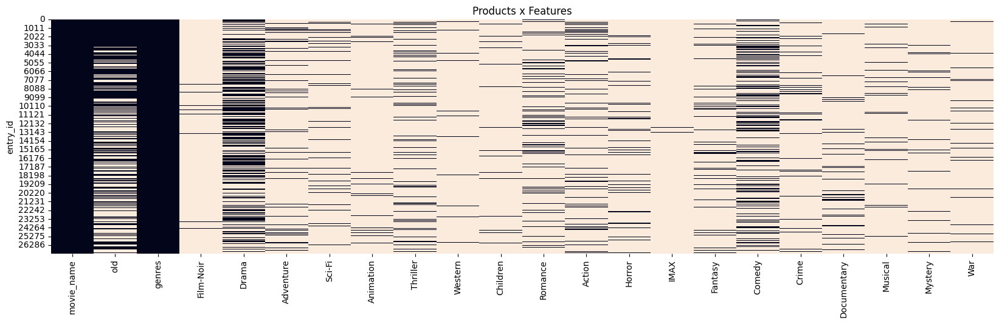

In [14]:
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(movies==0, vmin=0, vmax=1, cbar=False, ax=ax).set_title("Products x Features")
plt.show()

In [15]:
user_rating

,user,entry_id,timestamp,y
0,0,1,2005-04-02 23:53:47,3.5
1,0,28,2005-04-02 23:31:16,3.5
2,0,31,2005-04-02 23:33:39,3.5
3,0,46,2005-04-02 23:32:07,3.5
4,0,49,2005-04-02 23:29:40,3.5
...,...,...,...,...
20000258,138492,13767,2009-11-13 15:42:00,4.5
20000259,138492,13876,2009-12-03 18:31:48,4.5
20000260,138492,13890,2009-12-07 18:10:57,3.0
20000261,138492,14009,2009-11-13 15:42:24,5.0


In [16]:
tmp = user_rating.copy()
tmp = tmp.head(10000) #< heap memory exceded otherwise
user_rating = tmp.pivot_table(index="user", columns="entry_id", values="y")
missing_cols = list(set(movies.index) - set(user_rating.columns))
for col in missing_cols:
    user_rating[col] = np.nan
user_rating = user_rating[sorted(user_rating.columns)]

C:\Users\sorana\AppData\Local\Temp\ipykernel_21212\84046471.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  user_rating[col] = np.nan
C:\Users\sorana\AppData\Local\Temp\ipykernel_21212\84046471.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  user_rating[col] = np.nan
C:\Users\sorana\AppData\Local\Temp\ipykernel_21212\84046471.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd

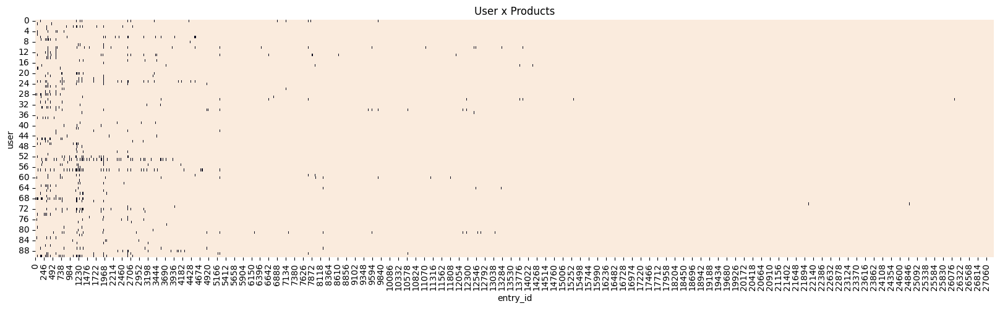

In [17]:
fig, ax = plt.subplots(figsize=(20,5))
sns.heatmap(user_rating.isnull(), vmin=0, vmax=1, cbar=False, ax=ax).set_title("User x Products")
plt.show()

# Preprocess data

In [18]:
user_rating = pd.DataFrame(preprocessing.MinMaxScaler(feature_range=(0.5,1)).fit_transform(user_rating.values), 
                         columns=user_rating.columns, index=user_rating.index)

C:\Users\sorana\.conda\envs\recomsys\lib\site-packages\sklearn\preprocessing\_data.py:464: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
C:\Users\sorana\.conda\envs\recomsys\lib\site-packages\sklearn\preprocessing\_data.py:465: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)


In [19]:
user_rating

entry_id,0,1,2,3,4,5,6,7,8,9,...,27268,27269,27270,27271,27272,27273,27274,27275,27276,27277
user,,,,,,,,,,,,,,,,,,,,,
0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,0.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.8750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,0.666667,NaN,NaN,NaN,0.833333,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,0.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
87,NaN,0.5,NaN,NaN,NaN,NaN,0.5000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
user_rating = user_rating[:750543]

In [16]:
user_rating = user_rating[["user", "entry_id", "y"]]

In [20]:
user_rating

entry_id,0,1,2,3,4,5,6,7,8,9,...,27268,27269,27270,27271,27272,27273,27274,27275,27276,27277
user,,,,,,,,,,,,,,,,,,,,,
0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,0.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.8750,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,0.666667,NaN,NaN,NaN,0.833333,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,0.9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
87,NaN,0.5,NaN,NaN,NaN,NaN,0.5000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
user_rating.to_csv('data/train_batch_first_5000')

In [21]:
user_rating["y"]

0         0.14
1         0.14
2         0.14
3         0.14
4         0.14
          ... 
750538    0.08
750539    0.14
750540    0.10
750541    0.08
750542    0.18
Name: y, Length: 750543, dtype: float64

In [22]:
split = int(0.8*user_rating.shape[1])
split


21822

In [21]:
user_rating.to_csv('data/first_batch.csv')

In [22]:
# Train
train_users = user_rating.loc[:, :split-1]
print("non-null data:", train_users[train_users>0].count().sum())
train_users

non-null data: 9974


entry_id,0,1,2,3,4,5,6,7,8,9,...,21812,21813,21814,21815,21816,21817,21818,21819,21820,21821
user,,,,,,,,,,,,,,,,,,,,,
0,NaN,3.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,4.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
87,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
# Test
test_user = user_rating.loc[:, split:]
print("non-null data:", test_user[test_user>0].count().sum())
test_user


non-null data: 26


entry_id,21822,21823,21824,21825,21826,21827,21828,21829,21830,21831,...,27268,27269,27270,27271,27272,27273,27274,27275,27276,27277
user,,,,,,,,,,,,,,,,,,,,,
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
87,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Neural Network

### Needed imports:

In [24]:
from tensorflow.keras import layers
import tensorflow as tf

from tensorflow.keras.layers import Input, Embedding, Dot, Dense, Reshape, Concatenate
from tensorflow.keras import Model, utils

### Training parameters:

In [25]:
embeding_size = 50
user_max, movie_max = user_rating.shape[0], user_rating.shape[1]

In [26]:
user_rating.shape

(91, 27278)

### Define the Model:

In [ ]:
# user embedding:
input_users = Input(name="user_inp", shape=(1,))
user_embedding = Embedding(name="user_emb", input_dim=user_max, output_dim=embeding_size)(input_users)
user_emb_r = Reshape(name='reshape_usr', target_shape=((embeding_size,)))(user_embedding)

In [ ]:
# movie embedding:
input_movie = Input(name="movie_inp", shape=(1,))
movie_embedding = Embedding(name="movie_emb", input_dim=movie_max, output_dim=embeding_size)(input_movie)
movie_emb_r = Reshape(name='reshape_movie', target_shape=((embeding_size,)))(movie_embedding)

In [ ]:
sim = Dot(name='dot', normalize=True, axes=1)([user_emb_r, movie_emb_r])

In [ ]:
y_out = layers.Dense(name="y_out", units=1, activation='linear')(sim)

In [ ]:
model = Model(inputs=[input_users,input_movie], outputs=y_out, name="CollaborativeFiltering")

In [ ]:
utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

#### Train:

In [28]:
train = train_users.stack(dropna=True).reset_index().rename(columns={0:"y"})
train

,user,entry_id,y
0,0,1,3.5
1,0,28,3.5
2,0,31,3.5
3,0,46,3.5
4,0,49,3.5
...,...,...,...
9969,90,2711,3.5
9970,90,2771,4.0
9971,90,2772,4.5
9972,90,2777,4.5


### Collaborative filtering

In [30]:
# MATRIX FACTORIZATION:

# user embedding:
input_users = Input(name="user_inp", shape=(1,))
user_embedding = Embedding(name="user_emb", input_dim=user_max, output_dim=embeding_size)(input_users)
user_emb_r = Reshape(name='reshape_usr', target_shape=((embeding_size,)))(user_embedding)

# movie embedding:
input_movie = Input(name="movie_inp", shape=(1,))
movie_embedding = Embedding(name="movie_emb", input_dim=movie_max, output_dim=embeding_size)(input_movie)
movie_emb_r = Reshape(name='reshape_movie', target_shape=((embeding_size,)))(movie_embedding)

sim = Dot(name='dot', normalize=True, axes=1)([user_emb_r, movie_emb_r])

y_out = layers.Dense(name="y_out", units=1, activation='linear')(sim)


In [31]:
# NEURAL COLLABORATIVE FILTERING:
# user embedding:
user_embedding1 = Embedding(name="user_emb1", input_dim=user_max, output_dim=embeding_size)(input_users)
user_emb_r1 = Reshape(name='reshape_usr1', target_shape=((embeding_size,)))(user_embedding1)

# movie embedding:
movie_embedding1 = Embedding(name="movie_emb1", input_dim=movie_max, output_dim=embeding_size)(input_movie)
movie_emb_r1 = Reshape(name='reshape_movie1', target_shape=((embeding_size,)))(movie_embedding1)

conc = Concatenate(name='concat')([user_emb_r1, movie_emb_r1])
dens = Dense(name='dense', units=embeding_size/2, activation='relu')(conc)

In [32]:
# CONCATENATE RESULTS
conc = Concatenate(name='concat2')([y_out, dens])
y_out = Dense(name='rating', units=1, activation='linear')(conc)

In [33]:
model = Model(inputs=[input_users,input_movie], outputs=y_out, name="NCF")

In [34]:
utils.plot_model(model, to_file='model2.png', show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


### Number of dense layers:

In [70]:
dense_layers_number = 1
dense_layers_units = [25]

In [86]:
# MATRIX FACTORIZATION:

# user embedding:
input_users = Input(name="user_inp", shape=(1,))
user_embedding = Embedding(name="user_emb", input_dim=user_max, output_dim=embeding_size)(input_users)
user_emb_r = Reshape(name='reshape_usr', target_shape=((embeding_size,)))(user_embedding)

user_model = Model(inputs=input_users, outputs=user_emb_r)

# movie embedding:
input_movie = Input(name="movie_inp", shape=(1,))
movie_embedding = Embedding(name="movie_emb", input_dim=movie_max, output_dim=embeding_size)(input_movie)
movie_emb_r = Reshape(name='reshape_movie', target_shape=((embeding_size,)))(movie_embedding)

movie_model = Model(inputs=input_movie, outputs=movie_emb_r)

sim = Dot(name='dot', normalize=True, axes=1)([user_emb_r, movie_emb_r])

y_out = layers.Dense(name="y_out", units=1, activation='linear')(sim)

In [87]:
# NEURAL COLLABORATIVE FILTERING:
# user embedding:
user_embedding1 = Embedding(name="user_emb1", input_dim=user_max, output_dim=embeding_size)(input_users)
user_emb_r1 = Reshape(name='reshape_usr1', target_shape=((embeding_size,)))(user_embedding1)

# movie embedding:
movie_embedding1 = Embedding(name="movie_emb1", input_dim=movie_max, output_dim=embeding_size)(input_movie)
movie_emb_r1 = Reshape(name='reshape_movie1', target_shape=((embeding_size,)))(movie_embedding1)

dens = Concatenate(name='concat')([user_emb_r1, movie_emb_r1])

for nmb_layer in range(dense_layers_number):
    dens = Dense(name='dense'+str(nmb_layer), units=dense_layers_units[nmb_layer], activation='relu')(dens)

In [88]:
# CONCATENATE RESULTS
conc = Concatenate(name='concat2')([y_out, dens])
y_out = Dense(name='rating', units=1, activation='linear')(conc)

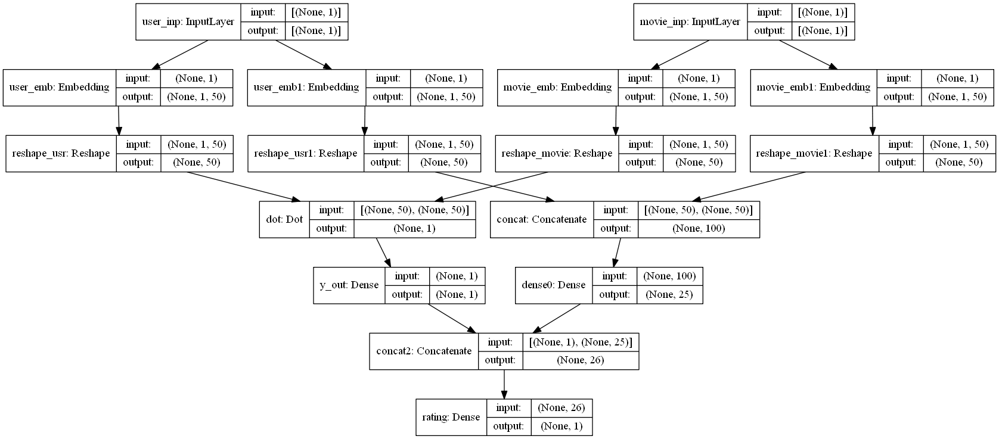

In [91]:
model = Model(inputs=[input_users,input_movie], outputs=y_out, name="NCF")
utils.plot_model(model, to_file='model2.png', show_shapes=True, show_layer_names=True)

In [92]:
model.compile(optimizer='adam', loss='mean_absolute_error', metrics=['mean_absolute_percentage_error'])

In [93]:
# Train
training = model.fit(x=[train["user"], train["entry_id"]], y=train["y"], epochs=100, batch_size=128, shuffle=True, verbose=1, validation_split=0.3)



Epoch 1/100
55/55 [==============================] - 11s 106ms/step - loss: 0.4019 - mean_absolute_percentage_error: 53.3294 - val_loss: 0.3421 - val_mean_absolute_percentage_error: 44.4632
Epoch 2/100
55/55 [==============================] - 5s 96ms/step - loss: 0.1632 - mean_absolute_percentage_error: 24.7465 - val_loss: 0.3561 - val_mean_absolute_percentage_error: 46.1393
Epoch 3/100
55/55 [==============================] - 3s 61ms/step - loss: 0.1105 - mean_absolute_percentage_error: 16.4392 - val_loss: 0.3534 - val_mean_absolute_percentage_error: 45.6745
Epoch 4/100
55/55 [==============================] - 3s 61ms/step - loss: 0.0811 - mean_absolute_percentage_error: 12.0736 - val_loss: 0.3546 - val_mean_absolute_percentage_error: 45.7589
Epoch 5/100
55/55 [==============================] - 3s 59ms/step - loss: 0.0659 - mean_absolute_percentage_error: 10.0754 - val_loss: 0.3534 - val_mean_absolute_percentage_error: 45.5642
Epoch 6/100
55/55 [==============================] - 3s 59

In [94]:
model.save('saved_model/first_train1')

INFO:tensorflow:Assets written to: saved_model/first_train1\assets


In [96]:
movie_model.save('saved_model/movie_model')

INFO:tensorflow:Assets written to: saved_model/movie_model\assets


In [78]:
model2 = tf.keras.models.load_model('saved_model/first_train')

In [79]:
model2.summary()

Model: "NCF"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
user_inp (InputLayer)           [(None, 1)]          0                                            
__________________________________________________________________________________________________
movie_inp (InputLayer)          [(None, 1)]          0                                            
__________________________________________________________________________________________________
user_emb (Embedding)            (None, 1, 50)        4550        user_inp[0][0]                   
__________________________________________________________________________________________________
movie_emb (Embedding)           (None, 1, 50)        1363900     movie_inp[0][0]                  
________________________________________________________________________________________________

In [80]:
print(user_max)

91


In [81]:
print(movie_max)

27278


In [84]:
model2.summary()

Model: "NCF"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
user_inp (InputLayer)           [(None, 1)]          0                                            
__________________________________________________________________________________________________
movie_inp (InputLayer)          [(None, 1)]          0                                            
__________________________________________________________________________________________________
user_emb (Embedding)            (None, 1, 50)        4550        user_inp[0][0]                   
__________________________________________________________________________________________________
movie_emb (Embedding)           (None, 1, 50)        1363900     movie_inp[0][0]                  
________________________________________________________________________________________________